In [1]:
import glob
from os import path
import pickle

import astropy.coordinates as coord
from astropy.table import Table, join
from astropy.wcs import WCS
import astropy.units as u
from astropy.io import fits
from astropy.visualization import (AsinhStretch, LinearStretch,
                                   ImageNormalize, ZScaleInterval,
                                   PercentileInterval, SqrtStretch,
                                   make_lupton_rgb)
import reproject
from reproject.mosaicking import find_optimal_celestial_wcs

import numpy as np
from matplotlib.gridspec import GridSpec
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline

from pyia import GaiaData

In [2]:
all_g = GaiaData('../data/data-joined.fits')
all_c = all_g.get_skycoord(distance=False)

near_cluster = (all_g.G0 < 20) & (all_g.pm_prob > 0.2)
g = all_g[near_cluster]
c = all_c[near_cluster]

/Users/apricewhelan/anaconda/lib/python3.7/site-packages/astropy/table/column.py:981: RuntimeWarning: invalid value encountered in less
  return getattr(self.data, op)(other)
/Users/apricewhelan/anaconda/lib/python3.7/site-packages/astropy/table/column.py:981: RuntimeWarning: invalid value encountered in greater
  return getattr(self.data, op)(other)


In [3]:
hdulist_g = fits.open('../data/c4d_180520_023922_osi_g_v1.fits.fz')
hdulist_i = fits.open('../data/c4d_180520_012130_osi_i_v1.fits.fz')

In [4]:
rows = []
for i in range(3):
    row = np.hstack([h.data for h in hdulist_g[3*i+1:3*i+4]])
    rows.append(row)
full_g = np.vstack(rows)

In [ ]:
# plt.imshow(full_g, origin='bottom')

In [4]:
def downsample_header(header, factor, axis):
    """
    Downsample a FITS header along an axis using the FITS convention for axis number
    """

    header = header.copy()

    cd = 'CDELT{0:d}'.format(axis)
    cp = 'CRPIX{0:d}'.format(axis)
    scalefactor = 1./factor
    header[cp] = (header[cp]-1)*scalefactor + scalefactor/2. + 0.5
    header[cd] = header[cd]*factor

    return header

In [5]:
def get_new_hdu(hdu, factor=8):
    wcs = WCS(hdu.header)
    
    new_hdr = downsample_header(wcs.to_header(), factor, 1)
    new_hdr = downsample_header(new_hdr, factor, 2)
    new_hdr['NAXIS'] = 2
    new_hdr['NAXIS1'] = hdu.data.shape[1] // factor
    new_hdr['NAXIS2'] = hdu.data.shape[0] // factor
    
    new_data, _ = reproject.reproject_interp(hdu, new_hdr)
    
    return fits.ImageHDU(data=new_data, header=new_hdr)

In [6]:
if not path.exists('joint_wcs.pkl'):
    wcs_out, shape_out = find_optimal_celestial_wcs(new_hdus)
    with open('joint_wcs.pkl', 'wb') as f:
        pickle.dump((wcs_out, shape_out), f)
else:
    with open('joint_wcs.pkl', 'rb') as f:
        (wcs_out, shape_out) = pickle.load(f)

In [7]:
data = dict()
for x in 'igu':
    filename = '../data/decam_stacked_{}.npy'.format(x)
    if not path.exists(filename):
        hdulist = fits.open(glob.glob('../data/c4d_*_osi_{}_v1.fits.fz'
                                      .format(x))[0])
        
        new_hdus = []
        for i in range(1, len(hdulist)):
            new_hdus.append(get_new_hdu(hdulist[i]))
            
        all_reproj = []
        for i in range(len(new_hdus)):
            new_data, _ = reproject.reproject_interp(new_hdus[i], wcs_out, 
                                                     shape_out=shape_out)
            all_reproj.append(new_data)
        full_data = np.nansum(all_reproj, axis=0)
        np.save(filename, full_data)
        data[x] = full_data
        
    else:
        data[x] = np.load(filename)

In [8]:
from astropy.visualization.lupton_rgb import AsinhZScaleMapping

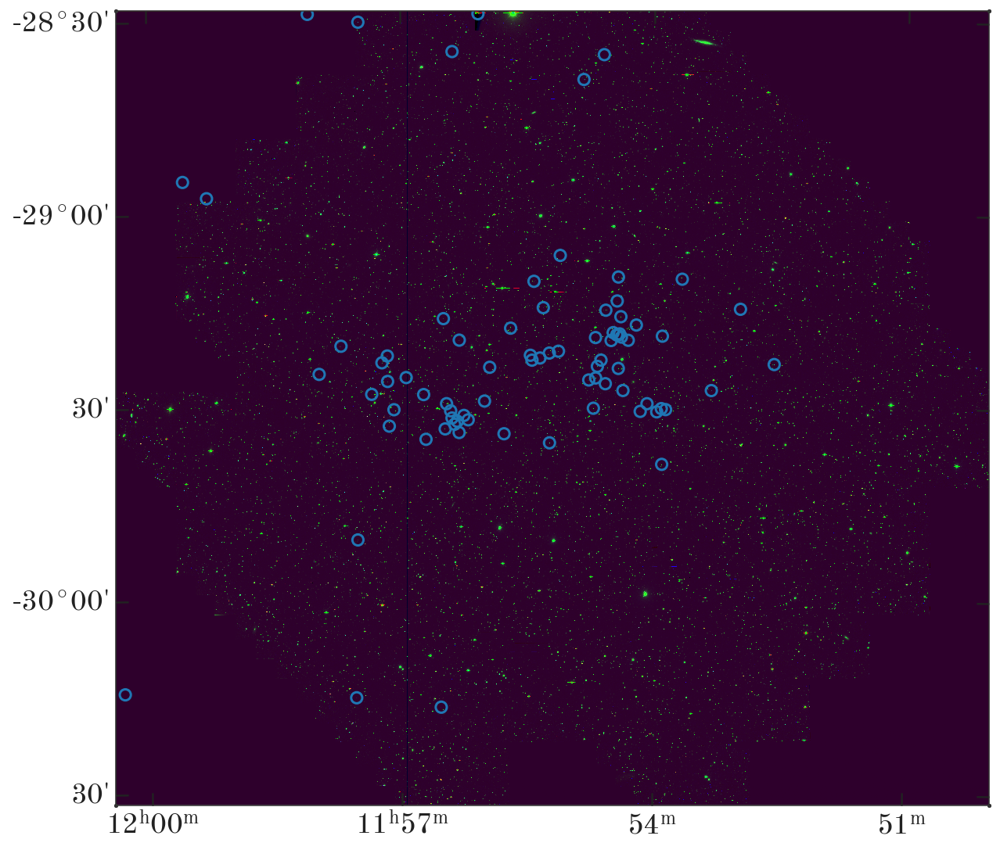

In [9]:
rr = data['i'] - data['i'][0,0]
gg = data['g'] - data['g'][0,0]
bb = data['u'] - data['u'][0,0]

rr = rr / np.nanpercentile(rr, 99.)
gg = gg / np.nanpercentile(gg, 99.)
bb = bb / np.nanpercentile(bb, 99.)

im = make_lupton_rgb(rr, gg, bb, stretch=5e0, Q=1e0)
# mapp = AsinhZScaleMapping(rr)
# im = mapp.make_rgb_image(rr, gg, bb)

fig, ax = plt.subplots(figsize=(10, 10),
                       subplot_kw=dict(projection=wcs_out))
ax.imshow(im, origin='lower')
ax.set_autoscale_on(False)

ax.scatter(g.ra, g.dec,
           transform=ax.get_transform('icrs'),
           s=50, facecolor='none', linewidth=1.5, color='tab:blue')


---

In [35]:
uu = data['u'] #- np.median(data['u'])
uu[uu<0] = np.nan

gg = data['g'] #- np.median(data['g'])
gg[gg<0] = np.nan

ii = data['i'] #- np.median(data['i'])
ii[ii<0] = np.nan

In [41]:
# flux_gi = np.log10(uu / gg)
flux_gi = gg / ii

/Users/apricewhelan/anaconda/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: divide by zero encountered in true_divide
  


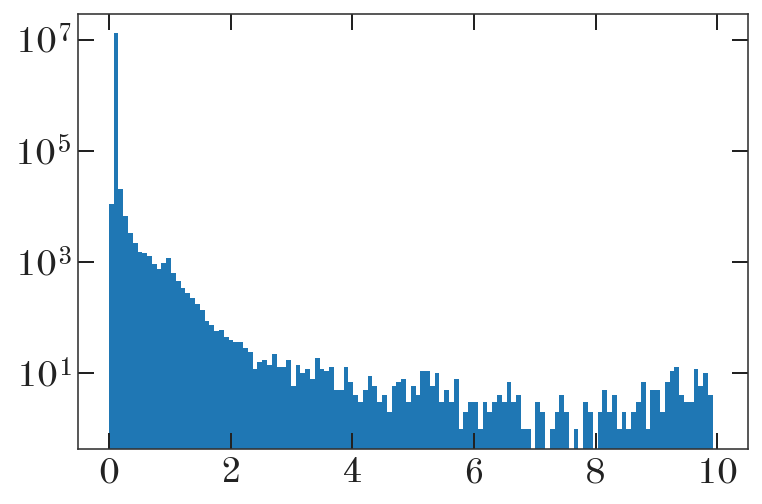

In [48]:
plt.hist(flux_gi.ravel(), bins=np.linspace(1e-5, 1e1, 128));
plt.yscale('log')

In [43]:
from astropy.visualization import LogStretch

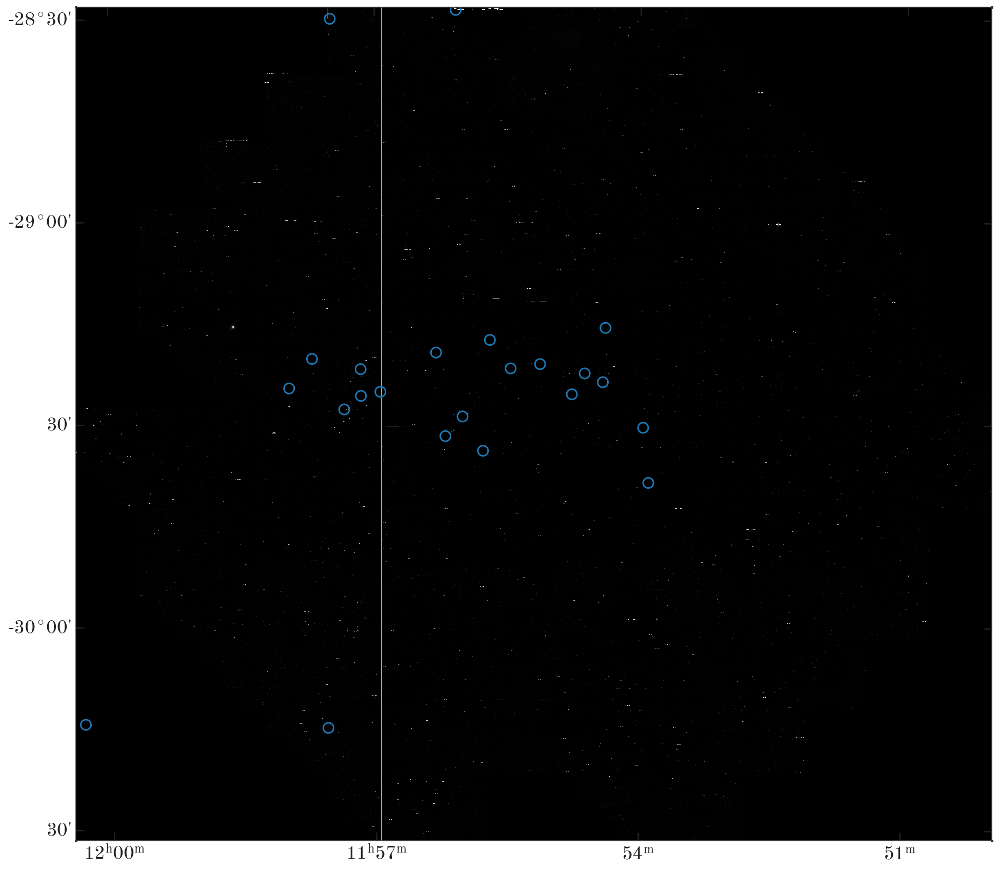

In [54]:
fig, ax = plt.subplots(1, 1, figsize=(16, 16), 
                       subplot_kw=dict(projection=wcs_out))

norm = ImageNormalize(flux_gi,
                      vmin=1e-4, vmax=1e-1,
#                       stretch=LogStretch())
                      stretch=AsinhStretch(a=1e2),
#                       stretch=SqrtStretch())
                      # vmin=7000, vmax=10000,
#                       interval=PercentileInterval(75))
#                       stretch=AsinhStretch(a=1e2))
                     )
ax.imshow(flux_gi, origin='lower', norm=norm, cmap='Greys')
ax.set_autoscale_on(False)

ax.scatter(g.ra[g.phot_g_mean_mag < 18*u.mag], 
           g.dec[g.phot_g_mean_mag < 18*u.mag],
           transform=ax.get_transform('icrs'),
           s=100, facecolor='none', linewidth=1.5, color='tab:blue')

# ax.set_xlim(1900, 2400)
# ax.set_ylim(1750, 2250)

# fig.savefig('../plots/image_decam_g.png', dpi=250)

---

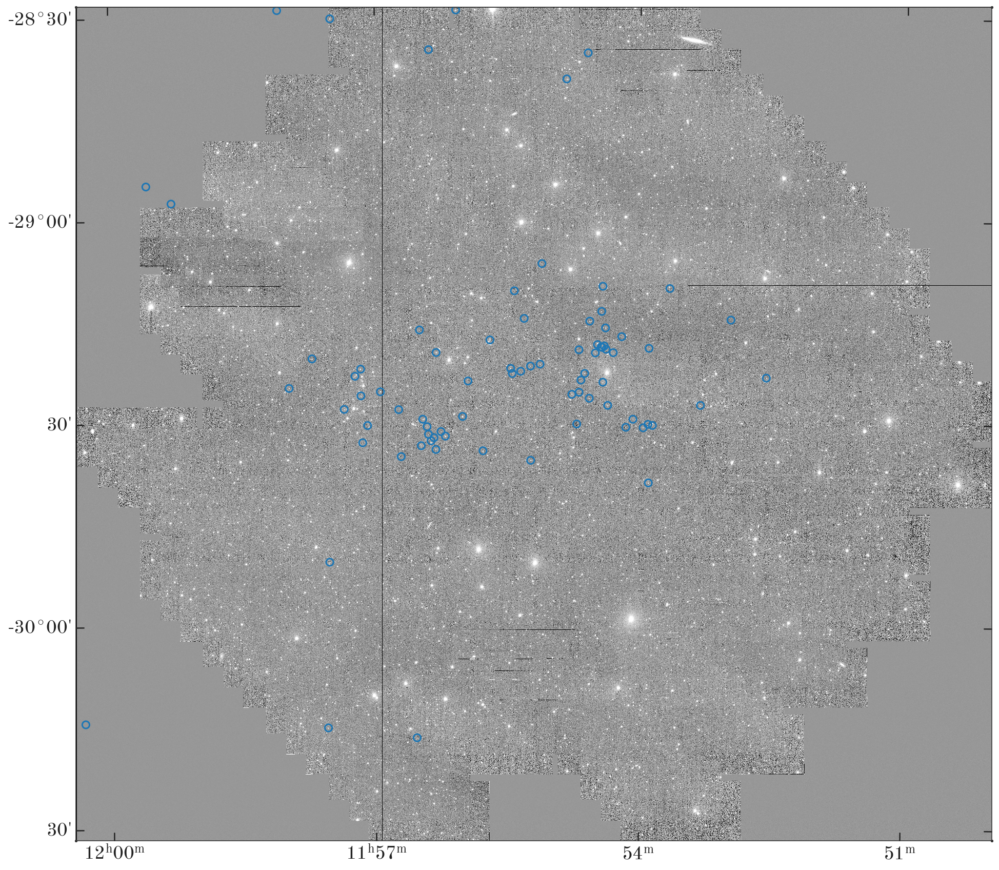

In [60]:
fig, ax = plt.subplots(1, 1, figsize=(16, 16), 
                       subplot_kw=dict(projection=wcs_out))

norm = ImageNormalize(data['u'][np.isfinite(data['u'])],
                      interval=PercentileInterval(99),
                      stretch=AsinhStretch(a=1e-1))
ax.imshow(data['u'], origin='lower', norm=norm, cmap='Greys_r')
ax.set_autoscale_on(False)

ax.scatter(g.ra, g.dec,
           transform=ax.get_transform('icrs'),
           s=50, facecolor='none', linewidth=1.5, color='tab:blue')

fig.savefig('../plots/image_decam_u.png', dpi=250)

In [11]:
decam_members = Table.read('../output/decam_membership.fits')
decam_members = decam_members[decam_members['membership_prob'] > 0.5]
len(decam_members)

/Users/apricewhelan/anaconda/lib/python3.7/site-packages/astropy/table/column.py:981: RuntimeWarning: invalid value encountered in greater
  return getattr(self.data, op)(other)


174

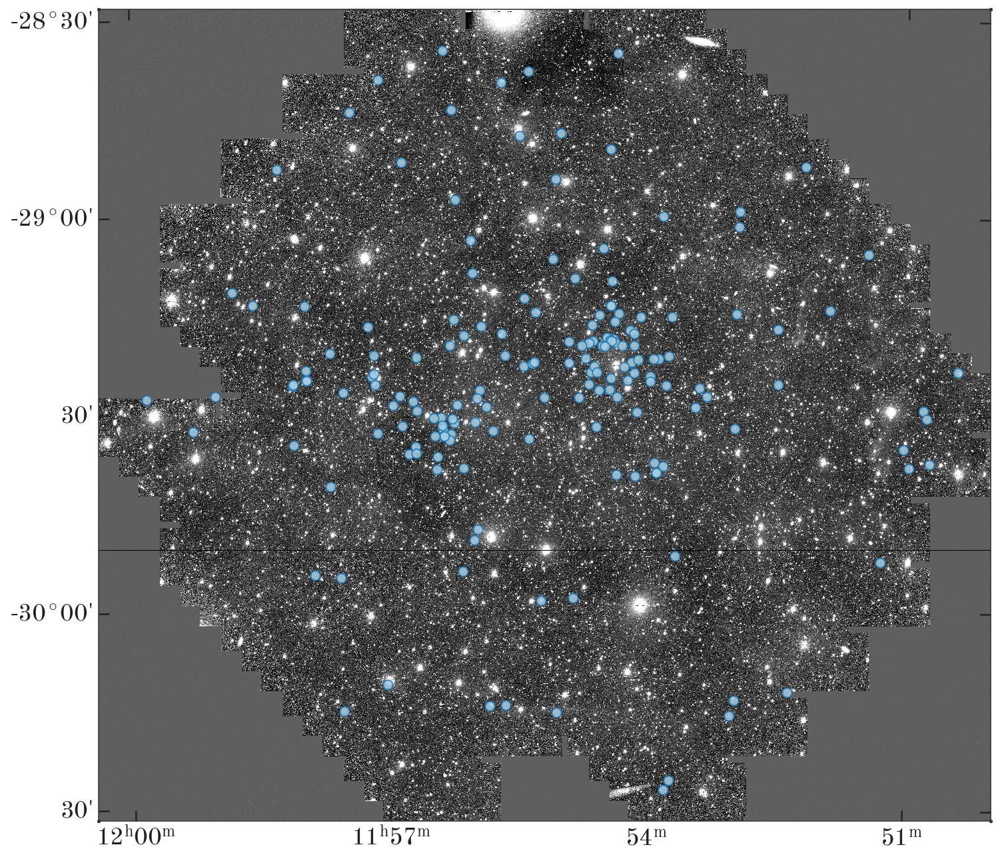

In [12]:
fig, ax = plt.subplots(1, 1, figsize=(12, 12), 
                       subplot_kw=dict(projection=wcs_out))

norm = ImageNormalize(data['g'],
                      interval=PercentileInterval(95.),
#                       interval=ZScaleInterval(contrast=0.4),
                      stretch=LinearStretch())
#                       stretch=AsinhStretch(a=1e0))
ax.imshow(data['g'], origin='lower', norm=norm, cmap='Greys_r')
ax.set_autoscale_on(False)

# ax.scatter(g.ra, g.dec,
#            transform=ax.get_transform('icrs'),
#            s=50, facecolor='none', linewidth=1.5, color='tab:blue')

ax.scatter(decam_members['ra'], decam_members['dec'],
           transform=ax.get_transform('icrs'),
           s=50, linewidth=1., color='#a6cee3', edgecolor='#1f78b4', alpha=0.85)

# fig.savefig('../plots/image_decam_g.png', dpi=250)
fig.savefig('../plots/image_decam_g.pdf', dpi=250)